In [85]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import chardet
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore

# DETEKSI ENCODING SECARA OTOMATIS
with open("20191002-reviews.csv", "rb") as f:
    result = chardet.detect(f.read(100000))  # Cek 100KB pertama
    encoding_type = result["encoding"]
    print(f"Detected Encoding: {encoding_type}")

# Path ke file CSV
file_path = "20191002-reviews.csv"

Detected Encoding: MacRoman


In [86]:
# 1. Menampilkan beberapa baris awal dari file CSV
print("\nMenampilkan beberapa baris awal dari file CSV:")
with open(file_path, "r", encoding=encoding_type, errors="replace") as f:
    for i in range(10):  # Menampilkan 10 baris pertama
        print(f.readline().strip())


Menampilkan beberapa baris awal dari file CSV:
itemId,category,name,rating,originalRating,reviewTitle,reviewContent,likeCount,upVotes,downVotes,helpful,relevanceScore,boughtDate,clientType,retrievedDate
100002528,beli-harddisk-eksternal,Kamal U.,5,,null,bagus  mantap dah sesui pesanan,0,0,0,true,26.51,09 Apr 2019,androidApp,2019-10-02
100002528,beli-harddisk-eksternal,yofanca m.,4,,null,"Bagus, sesuai foto",0,0,0,true,22.49,24 Sep 2017,androidApp,2019-10-02
100002528,beli-harddisk-eksternal,Lazada Customer,5,,ok mantaaapppp barang sesuai pesanan.. good,okkkkk mantaaaaaaapppp ... goood,0,0,0,true,21.5,04 Apr 2018,androidApp,2019-10-02
100002528,beli-harddisk-eksternal,Lazada Customer,4,,,bagus sesuai,0,0,0,true,20.51,22 Sep 2017,androidApp,2019-10-02
100002528,beli-harddisk-eksternal,Yosep M.,5,,null,null,0,0,0,true,16.01,17 Agu 2018,androidApp,2019-10-02
100002528,beli-harddisk-eksternal,Deden,5,,null,null,0,0,0,true,16.01,02 Nov 2017,androidApp,2019-10-02
100002528,beli-harddisk-ekst

In [87]:
# 2. Cek jumlah kolom di setiap baris untuk mendeteksi inkonsistensi
print("\nMendeteksi baris dengan jumlah kolom tidak sesuai:")
with open(file_path, "r", encoding=encoding_type, errors="replace") as f:
    header = f.readline().strip().split(",")  # Ambil header
    num_columns = len(header)  # Jumlah kolom yang seharusnya
    
    for i, line in enumerate(f, start=2):  # Mulai dari baris kedua
        if len(line.strip().split(",")) != num_columns:
            print(f"Baris {i} bermasalah: {line.strip()}")


Mendeteksi baris dengan jumlah kolom tidak sesuai:
Baris 3 bermasalah: 100002528,beli-harddisk-eksternal,yofanca m.,4,,null,"Bagus, sesuai foto",0,0,0,true,22.49,24 Sep 2017,androidApp,2019-10-02
Baris 11 bermasalah: 100003785,beli-harddisk-eksternal,agung p.,5,,Barang bagus sesuai specs,"Pesan rabu sore,minggu sore sampe,,barang sesuai specs mantab,tks lazada",0,0,0,true,19.5,01 Mar 2017,mobile,2019-10-02
Baris 13 bermasalah: 100004132,beli-harddisk-eksternal,Lazada Guest,1,,Ini cicil pake apa?,"Mau tanya ini cicilnya pake apa ya,cc bkn?",7,7,0,true,14.88,,androidApp,2019-10-02
Baris 17 bermasalah: 100004505,beli-harddisk-eksternal,Lazada Guest,1,,Cara mendapatkan garansi,"Bagaimana tv LED saya merek Sharp 24 hitam LC 24LE170i sekarang mati total baru 2 bln kemana saya harus menghubungi dan meminta bantuan mohon kebijakan dan solusinya ,, so,alnya masih garansi kepada pihak lazada saya mohon bantuannya terimakasih!!!",14,14,0,true,22.67,,mobile-app,2019-10-02
Baris 32 bermasalah: 100

In [88]:
# 3. Membaca CSV dengan mode toleransi error
try:
    df = pd.read_csv(
        file_path,
        delimiter=",",
        quoting=3,
        encoding=encoding_type,
        quotechar='"',
        on_bad_lines="skip",
        engine="python"  # Gunakan engine python untuk fleksibilitas
    )
    print("\nDataset berhasil dimuat tanpa error!")
except Exception as e:
    print(f"Terjadi error saat membaca CSV: {e}")
    exit()

# Simpan jumlah data sebelum pembersihan
df_before = df.copy()
print(f"\nJumlah data sebelum pembersihan: {len(df_before)}")


Dataset berhasil dimuat tanpa error!

Jumlah data sebelum pembersihan: 158497


In [89]:
# a) Tampilkan jumlah missing values sebelum pembersihan
print("\nJumlah missing values sebelum pembersihan:\n", df.isna().sum())

# b) Hapus duplikasi lebih mendalam berdasarkan reviewContent dan itemId
if "reviewContent" in df.columns and "itemId" in df.columns:
    df = df.drop_duplicates(subset=["reviewContent", "itemId"])
    print(f"Jumlah data setelah menghapus duplikasi lebih spesifik: {len(df)}")
else:
    print("Kolom 'reviewContent' atau 'itemId' tidak ditemukan dalam dataset!")

# c) Konversi kolom rating ke numerik
if "rating" in df.columns:
    df["rating"] = pd.to_numeric(df["rating"], errors="coerce")  # Ubah ke numerik, jika gagal jadi NaN

    # Tampilkan jumlah NaN sebelum menghapus
    print("\nJumlah missing values setelah konversi rating:\n", df.isna().sum())

    df = df.dropna(subset=["rating"])  # Hapus baris dengan rating kosong
else:
    print("Kolom 'rating' tidak ditemukan dalam dataset!")
    exit()

# d) Deteksi dan hapus outlier dengan metode Z-Score
df["z_score"] = zscore(df["rating"])  # Hitung Z-Score
threshold = 3  # Bisa diubah ke 2 jika ingin lebih longgar
df = df[(df["z_score"] > -threshold) & (df["z_score"] < threshold)]  # Filter outlier

print(f"\nJumlah data setelah menghapus outlier dengan Z-Score: {len(df)}")

# e) Normalisasi menggunakan Min-Max Scaler
scaler = MinMaxScaler()
df["rating_scaled"] = scaler.fit_transform(df[["rating"]])

# Hapus kolom Z-Score karena tidak diperlukan lagi
df.drop(columns=["z_score"], inplace=True)


Jumlah missing values sebelum pembersihan:
 itemId                 0
category               0
name                   0
rating                 0
originalRating    158493
reviewTitle       145481
reviewContent      96356
likeCount              0
upVotes                0
downVotes              0
helpful                0
relevanceScore         0
boughtDate          4603
clientType             0
retrievedDate          0
dtype: int64
Jumlah data setelah menghapus duplikasi lebih spesifik: 27494

Jumlah missing values setelah konversi rating:
 itemId                0
category              0
name                  0
rating                0
originalRating    27493
reviewTitle       22756
reviewContent      3295
likeCount             0
upVotes               0
downVotes             0
helpful               0
relevanceScore        0
boughtDate         1398
clientType            0
retrievedDate         0
dtype: int64

Jumlah data setelah menghapus outlier dengan Z-Score: 25772


In [90]:
# 5. Simpan dataset yang sudah dibersihkan
df.to_csv("cleaned_reviews.csv", index=False, encoding=encoding_type)
print("\nFile 'cleaned_reviews.csv' berhasil disimpan!")


File 'cleaned_reviews.csv' berhasil disimpan!


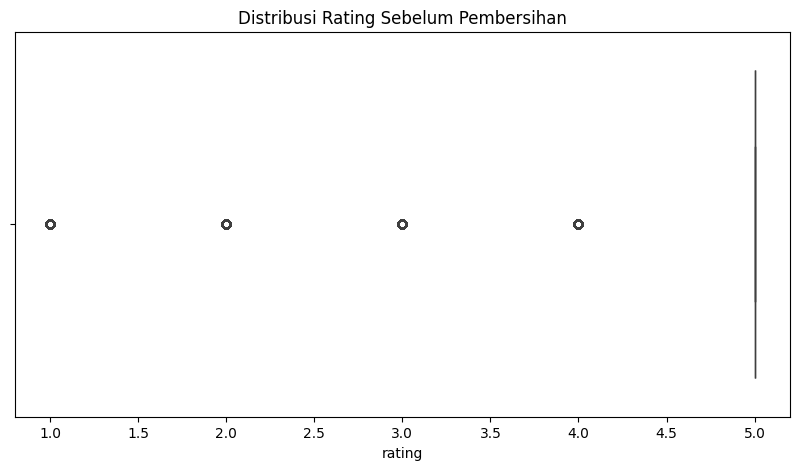

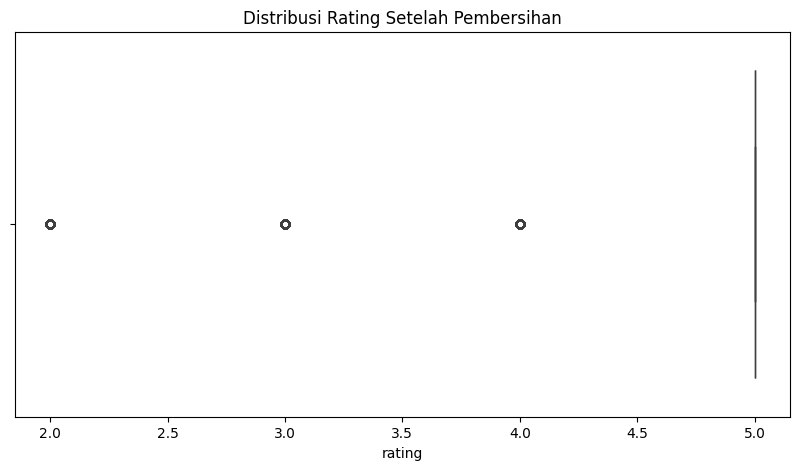

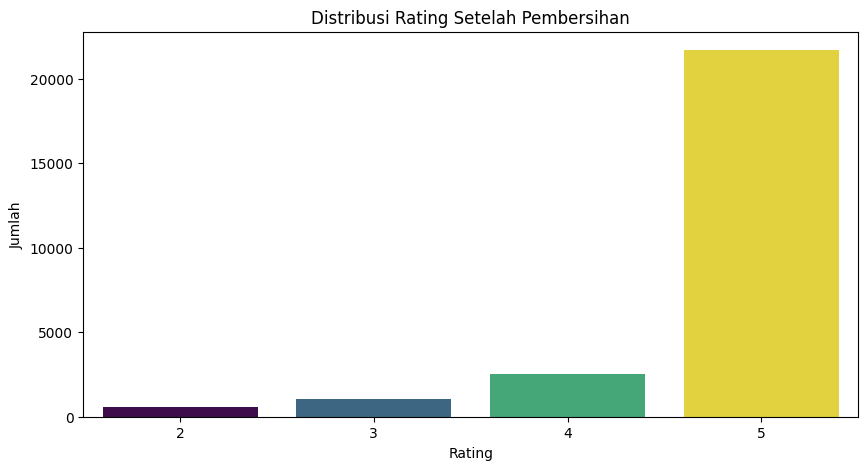


Deskripsi Statistik Rating Setelah Pembersihan:
count    25772.000000
mean         4.758536
std          0.625607
min          2.000000
25%          5.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: rating, dtype: float64

Nilai unik dalam rating setelah pembersihan:
[5 4 3 2]


In [91]:
# 6. Visualisasi perbandingan sebelum vs. sesudah pembersihan
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_before["rating"])
plt.title("Distribusi Rating Sebelum Pembersihan")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x=df["rating"])
plt.title("Distribusi Rating Setelah Pembersihan")
plt.show()

plt.figure(figsize=(10, 5))
sns.countplot(x=df["rating"], hue=df["rating"], palette="viridis", legend=False)
plt.title("Distribusi Rating Setelah Pembersihan")
plt.xlabel("Rating")
plt.ylabel("Jumlah")
plt.show()

print("\nDeskripsi Statistik Rating Setelah Pembersihan:")
print(df["rating"].describe())

print("\nNilai unik dalam rating setelah pembersihan:")
print(df["rating"].unique())

In [92]:

# 7. Menampilkan perbandingan jumlah data sebelum dan sesudah pembersihan
print(f"\nPerbandingan jumlah data:")
print(f"- Sebelum pembersihan: {len(df_before)} baris")
print(f"- Setelah pembersihan: {len(df)} baris")



Perbandingan jumlah data:
- Sebelum pembersihan: 158497 baris
- Setelah pembersihan: 25772 baris
